In [1]:
# Manipulación de datos
import pandas as pd

# Base de Datos y Variables de Entorno
from conexion import connect_to_postgresql

# Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import rcParams
from math import ceil
rcParams['font.family'] = 'DejaVu Sans'

# Machine Learning y estadística
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.stats import chi2


In [2]:
pd.set_option("display.max_columns", None)
pd.options.display.float_format = '{:,.2f}'.format

# Carga de los datos


In [3]:
engine = connect_to_postgresql()
conn = engine.raw_connection()
cur = conn.cursor()
try:
    query = """
    SELECT *
    FROM public.ft_viviendas_caracteristicas AS car
    LEFT JOIN public.indicadores_cyl_raw AS ind 
      ON ind."Provincia" = car."NPRO"
        AND ind."Municipio" = car."NMUN"
        AND EXTRACT(YEAR FROM TO_DATE(car."Fecha", 'DD/MM/YYYY')) = CAST(ind."Periodo" AS INTEGER);
    """
    cur.execute(query)

    df_eda = pd.DataFrame(cur.fetchall(), columns=[desc[0] for desc in cur.description])

    conn.commit()
    print("La consulta se ha ejecutado con éxito")
except Exception as e:
    print(f"Ha ocurrido un error: {str(e)}")
finally:
    cur.close()
    conn.close()

df_eda.head()

Conexión establecida
La consulta se ha ejecutado con éxito


,Fecha,ID,Inmueble,Caracteristicas,Habitaciones,Aseos,Terraza,Piscina,Garaje,Precio,Metros,CodigoPostal,CUDIS,NPRO,NMUN,Periodo,Municipio,Provincia,Media de la renta por unidad de consumo,Mediana de la renta por unidad de consumo,Renta bruta media por hogar,Renta neta media por hogar,Renta neta media por persona,CP,Fuente de ingreso: otras prestaciones,Fuente de ingreso: otros ingresos,Fuente de ingreso: pensiones,Fuente de ingreso: prestaciones por desempleo,Fuente de ingreso: salario,Edad media de la población,Población,Porcentaje de hogares unipersonales,Porcentaje de población de 65 y más años,Porcentaje de población española,Porcentaje de población menor de 18 años,Tamaño medio del hogar,Distribución de la renta P80/P20,Índice de Gini,Renta bruta media por persona
0,31/12/2021,"162,226,855.00",Flat,Flat,2.00,1.00,0.00,0.00,0.00,"56,000.00",66.00,24192,"2,408,909.00",León,León,"2,021.00",León,León,"21,194.00","19,250.00","39,582.00","32,677.00","14,842.00",24089,780.00,"1,963.00","5,340.00",357.00,"9,537.00",48.30,"120,082.00",37.00,28.00,93.70,14.00,2.20,2.70,30.90,"35,956.00"
1,31/12/2021,"162,222,099.00",Flat,Flat,3.00,1.00,1.00,0.00,1.00,"100,000.00",90.00,49005,"4,927,501.00",Zamora,Zamora,"2,021.00",Zamora,Zamora,"19,149.00","17,150.00","35,406.00","29,763.00","13,391.00",49275,665.00,"1,598.00","4,510.00",408.00,"8,749.00",48.00,"59,150.00",34.40,26.80,96.40,13.80,2.20,2.70,30.20,"31,860.00"
2,31/12/2021,"162,223,190.00",Flat,Flat,3.00,1.00,0.00,0.00,0.00,"85,700.00","90,000.00",09005,"905,905.00",Burgos,Burgos,"2,021.00",Burgos,Burgos,"21,874.00","19,950.00","42,954.00","35,323.00","15,001.00",09059,579.00,"1,906.00","4,637.00",403.00,"10,718.00",45.40,"171,355.00",33.40,23.70,92.20,16.30,2.30,2.40,28.30,"36,484.00"
3,31/12/2021,"162,223,186.00",Flat,Flat,2.00,1.00,0.00,0.00,0.00,"49,100.00",49.00,09003,"905,904.00",Burgos,Burgos,"2,021.00",Burgos,Burgos,"21,874.00","19,950.00","42,954.00","35,323.00","15,001.00",09059,579.00,"1,906.00","4,637.00",403.00,"10,718.00",45.40,"171,355.00",33.40,23.70,92.20,16.30,2.30,2.40,28.30,"36,484.00"
4,31/12/2021,"162,223,182.00",Flat,Attic,3.00,2.00,1.00,0.00,0.00,"85,000.00",92.00,37006,"3,727,404.00",Salamanca,Salamanca,"2,021.00",Salamanca,Salamanca,"19,590.00","17,150.00","36,686.00","30,602.00","13,756.00",37274,694.00,"2,045.00","4,862.00",406.00,"8,484.00",48.10,"141,010.00",36.80,28.20,93.30,13.90,2.20,2.90,32.50,"32,982.00"


In [4]:
df = df_eda.copy()

In [5]:
columns = ['ID', 'CodigoPostal', 'NPRO', 'NMUN', 'CP', 'Periodo']
df.drop(columns=columns, axis = 1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23595 entries, 0 to 23594
Data columns (total 33 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Fecha                                          23595 non-null  object 
 1   Inmueble                                       23595 non-null  object 
 2   Caracteristicas                                23582 non-null  object 
 3   Habitaciones                                   22790 non-null  float64
 4   Aseos                                          22887 non-null  float64
 5   Terraza                                        23595 non-null  float64
 6   Piscina                                        23595 non-null  float64
 7   Garaje                                         23595 non-null  float64
 8   Precio                                         23222 non-null  float64
 9   Metros                                         234

# Limpieza de los datos

## Análisis Preliminar 

In [6]:
# Variables numéricas
df.describe()

,Habitaciones,Aseos,Terraza,Piscina,Garaje,Precio,Metros,CUDIS,Media de la renta por unidad de consumo,Mediana de la renta por unidad de consumo,Renta bruta media por hogar,Renta neta media por hogar,Renta neta media por persona,Fuente de ingreso: otras prestaciones,Fuente de ingreso: otros ingresos,Fuente de ingreso: pensiones,Fuente de ingreso: prestaciones por desempleo,Fuente de ingreso: salario,Edad media de la población,Población,Porcentaje de hogares unipersonales,Porcentaje de población de 65 y más años,Porcentaje de población española,Porcentaje de población menor de 18 años,Tamaño medio del hogar,Distribución de la renta P80/P20,Índice de Gini,Renta bruta media por persona
count,"22,790.00","22,887.00","23,595.00","23,595.00","23,595.00","23,222.00","23,411.00","23,595.00","23,220.00","23,220.00","23,590.00","23,590.00","23,590.00","23,211.00","23,211.00","23,211.00","23,211.00","23,211.00","23,590.00","23,590.00","23,590.00","23,590.00","23,590.00","23,590.00","23,590.00","23,220.00","23,220.00","23,590.00"
mean,3.15,1.76,0.35,0.06,0.08,"150,609.07",373.33,"3,069,524.62","19,362.26","17,250.82","36,921.75","30,875.74","13,380.75",637.57,"1,894.11","3,963.50",404.10,"9,088.79",46.51,"70,381.81",35.04,24.30,93.19,15.10,2.29,2.56,29.85,"31,977.86"
std,1.50,0.97,0.48,0.24,0.28,"512,189.13","14,588.30","1,454,394.92","2,202.25","2,034.47","5,826.89","4,280.35","1,458.51",109.22,490.98,"1,116.20",81.53,"1,821.42",4.55,"84,101.89",6.65,7.56,3.75,4.16,0.19,0.28,2.55,"4,050.98"
min,1.00,1.00,0.00,0.00,0.00,"10,000.00",1.00,"500,101.00","12,334.00","10,150.00","17,221.00","15,878.00","8,791.00",191.00,287.00,"1,162.00",79.00,"2,643.00",33.60,8.00,0.00,5.40,58.90,0.00,1.10,1.80,20.30,"18,956.00"
25%,2.00,1.00,0.00,0.00,0.00,"74,900.00",78.00,"2,408,902.00","18,239.00","16,450.00","34,295.00","29,171.00","12,540.00",570.00,"1,598.00","3,165.00",367.00,"8,484.00",44.00,"2,737.00",32.30,20.80,92.20,13.90,2.20,2.40,28.30,"29,568.00"
50%,3.00,2.00,0.00,0.00,0.00,"119,900.00",100.00,"3,727,403.00","19,590.00","17,150.00","36,686.00","30,602.00","13,756.00",655.00,"1,916.00","4,286.00",406.00,"9,061.00",47.70,"29,718.00",35.50,25.70,93.30,14.30,2.30,2.60,30.30,"32,982.00"
75%,4.00,2.00,1.00,0.00,0.00,"179,000.00",150.00,"4,009,301.00","20,625.00","18,550.00","41,235.00","34,095.00","14,290.75",694.00,"2,045.00","4,862.00",446.00,"10,287.00",48.10,"141,010.00",36.80,28.20,95.80,16.90,2.40,2.80,32.50,"34,386.00"
max,102.00,25.00,1.00,1.00,1.00,"75,000,000.00","1,530,000.00","4,927,505.00","29,748.00","28,350.00","83,292.00","71,987.00","20,147.00","1,378.00","7,431.00","8,795.00","1,277.00","16,165.00",73.40,"294,264.00",87.50,72.20,100.00,30.80,3.70,4.20,44.20,"51,514.00"


- Garaje, piscina y terraza son valores categóricos y hay que transformarlos (0: No, 1: Si).
- Hay que revisar el piso que tiene 102 habitaciones y tiene un precio de 75M, porque es un outlier. Habrá que hacer el estudio del mismo.
- Hay que revisar los valores nulos y mal asignados para ver como imputarlos o eliminarlos. 
- Hay que ver si nos quedamos con la variable "caracteristicas" o solo con "Inmueble"

In [7]:
categorias = ['Terraza', 'Piscina', 'Garaje']
df[categorias] = df[categorias].astype('category')
df['Fecha'] = pd.to_datetime(df['Fecha'], format = '%d/%m/%Y', errors='coerce')
df.dtypes


Fecha                                            datetime64[ns]
Inmueble                                                 object
Caracteristicas                                          object
Habitaciones                                            float64
Aseos                                                   float64
Terraza                                                category
Piscina                                                category
Garaje                                                 category
Precio                                                  float64
Metros                                                  float64
CUDIS                                                   float64
Municipio                                                object
Provincia                                                object
Media de la renta por unidad de consumo                 float64
Mediana de la renta por unidad de consumo               float64
Renta bruta media por hogar             

In [8]:
df.isna().sum().sort_values(ascending = False)

Habitaciones                                     805
Aseos                                            708
Fuente de ingreso: prestaciones por desempleo    384
Fuente de ingreso: otros ingresos                384
Fuente de ingreso: salario                       384
Fuente de ingreso: otras prestaciones            384
Fuente de ingreso: pensiones                     384
Índice de Gini                                   375
Media de la renta por unidad de consumo          375
Mediana de la renta por unidad de consumo        375
Distribución de la renta P80/P20                 375
Precio                                           373
Metros                                           184
Caracteristicas                                   13
Población                                          5
Renta bruta media por hogar                        5
Municipio                                          5
Tamaño medio del hogar                             5
Edad media de la población                    

La variable "Habitaciones" es la que más nulos tiene, pero es menos de un 5%, por lo que podremos imputar los valores de todos las varaibles que nos faltan.

## Análisis de las variables categóricas

In [9]:
def graficos_eda_categoricos(categoricas):
    """
    Esta función grafica la distribución de todas las variables categóricas que existen en un dataframe mediante gráfica de barras horizontales
    :param df: (DataFrame) el dataframe del cual se quieren graficar todas las variables categóricas
    :return imagen: una imagen con todas las distribuciones posibles
    """
   
    filas = ceil(categoricas.shape[1] / 2)

    f, ax = plt.subplots(nrows = filas, ncols = 2, figsize = (16, filas * 6))

    ax = ax.flat 

    for posicion, variable in enumerate(categoricas):
        categoricas[variable].value_counts().plot.barh(ax = ax[posicion], color='plum', edgecolor='black')
        ax[posicion].set_title(variable, fontsize = 12, fontweight = "bold")
        ax[posicion].tick_params(labelsize = 12)
        

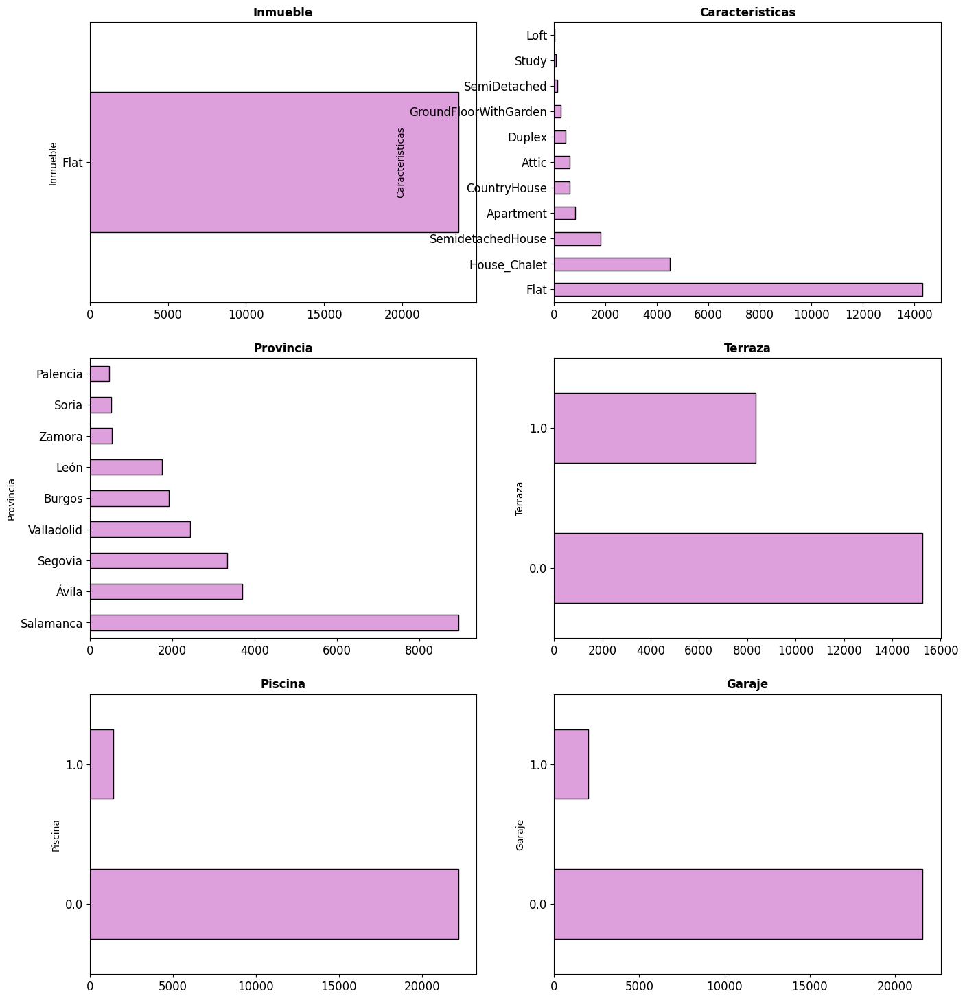

In [10]:
# Filtrar columnas categóricas que tienen más de 5 valores únicos y contienen datos relevantes
filtered_columns = [col for col in df.select_dtypes('O').columns if df[col].nunique() < 20]
total_columns_o = filtered_columns + (list(categorias))
graficos_eda_categoricos(df[total_columns_o])

In [11]:
df['Terraza'].value_counts()

Terraza
0.00    15251
1.00     8344
Name: count, dtype: int64

In [12]:
df['Garaje'].value_counts()

Garaje
0.00    21600
1.00     1995
Name: count, dtype: int64

In [13]:
df['Piscina'].value_counts()

Piscina
0.00    22184
1.00     1411
Name: count, dtype: int64

In [14]:
df['Comodidades'] = df['Terraza'].astype(int) + df['Piscina'].astype(int) + df['Garaje'].astype(int)
df['Comodidades'].value_counts()

Comodidades
0    13699
1     8113
2     1712
3       71
Name: count, dtype: int64

In [15]:
df.drop(['Terraza', 'Piscina', 'Garaje'], axis = 1, inplace = True)

In [16]:
df[['Caracteristicas', 'Provincia', 'Comodidades']].isna().sum().sort_values(ascending = False)

Caracteristicas    13
Provincia           5
Comodidades         0
dtype: int64

In [17]:
df[df['Provincia'].isnull()]

,Fecha,Inmueble,Caracteristicas,Habitaciones,Aseos,Precio,Metros,CUDIS,Municipio,Provincia,Media de la renta por unidad de consumo,Mediana de la renta por unidad de consumo,Renta bruta media por hogar,Renta neta media por hogar,Renta neta media por persona,Fuente de ingreso: otras prestaciones,Fuente de ingreso: otros ingresos,Fuente de ingreso: pensiones,Fuente de ingreso: prestaciones por desempleo,Fuente de ingreso: salario,Edad media de la población,Población,Porcentaje de hogares unipersonales,Porcentaje de población de 65 y más años,Porcentaje de población española,Porcentaje de población menor de 18 años,Tamaño medio del hogar,Distribución de la renta P80/P20,Índice de Gini,Renta bruta media por persona,Comodidades
2310,2022-01-26,Flat,House_Chalet,2.00,1.00,"49,500.00",104.00,"2,414,101.00",None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
22137,2022-01-07,Flat,CountryHouse,4.00,1.00,"16,000.00",100.00,"930,601.00",None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
22946,2022-01-04,Flat,House_Chalet,3.00,2.00,"65,000.00",209.00,"2,414,101.00",None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
23330,2022-01-02,Flat,CountryHouse,8.00,2.00,"30,000.00",622.00,"3,411,001.00",None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
23360,2022-01-02,Flat,House_Chalet,2.00,1.00,"49,500.00",103.00,"2,414,101.00",None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


### Conclusiones

- La mayoria de los inmuebles no tienen piscina ni garaje. Se valorará más adelante (después del análisis de outliers) si merece la pena dejar las propiedades que tienen piscina y garaje 
- Todos los inmuebles son pisos, pero tienen distintas características, siendo la mayoritaria "Flat", por lo que la columna "Inmueble" no aporta nada al análisis y se va a poder eliminar.
- Palencia, Soria y Zamora tienen muy pocos inmuebles y Salamanca igual tiene de más.
- Los 5 valores que no tienen provincia asignada se puede eliminar
- Las caracteristicas de las casas se van a unificar como viso o viviendas unifamiliares para evitar el exceso de caracteristicas

In [18]:
df.drop(columns = 'Inmueble', inplace = True)
df['Caracteristicas'] = df['Caracteristicas'].fillna('Flat')
df = df.dropna(subset=['Provincia'])

In [19]:
# Diccionario para agrupar características en inglés
group_mapping = {
    'Flat': 'Apartment',
    'Attic': 'Apartment',
    'Apartment': 'Apartment',
    'Duplex': 'Apartment',
    'Loft': 'Apartment',
    'GroundFloorWithGarden': 'Apartment',
    'Study': 'Apartment',
    'House_Chalet': 'Single-family Home',
    'SemidetachedHouse': 'Single-family Home',
    'CountryHouse': 'Single-family Home',
    'SemiDetached': 'Single-family Home'
}

# Crear nueva columna agrupada
df['Tipo_Vivienda'] = df['Caracteristicas'].map(group_mapping)

In [20]:
# Diccionario que identifica las capitales de provincia en Castilla y León
capitales_cyl = {
    'León': True,
    'Zamora': True,
    'Burgos': True,
    'Salamanca': True,
    'Valladolid': True,
    'Palencia': True,
    'Ávila': True,
    'Segovia': True,
    'Soria': True,
}

# Agregar a los municipios no capitales de Castilla y León
otros_municipios_cyl = list(set(df['Municipio']) - set(df['Provincia']))
for municipio in otros_municipios_cyl:
    capitales_cyl[municipio] = False

# Crear la nueva columna basada en el diccionario
df['Capital'] = df['Municipio'].map(capitales_cyl).fillna(False).astype(bool)

In [21]:
df.head()

,Fecha,Caracteristicas,Habitaciones,Aseos,Precio,Metros,CUDIS,Municipio,Provincia,Media de la renta por unidad de consumo,Mediana de la renta por unidad de consumo,Renta bruta media por hogar,Renta neta media por hogar,Renta neta media por persona,Fuente de ingreso: otras prestaciones,Fuente de ingreso: otros ingresos,Fuente de ingreso: pensiones,Fuente de ingreso: prestaciones por desempleo,Fuente de ingreso: salario,Edad media de la población,Población,Porcentaje de hogares unipersonales,Porcentaje de población de 65 y más años,Porcentaje de población española,Porcentaje de población menor de 18 años,Tamaño medio del hogar,Distribución de la renta P80/P20,Índice de Gini,Renta bruta media por persona,Comodidades,Tipo_Vivienda,Capital
0,2021-12-31,Flat,2.00,1.00,"56,000.00",66.00,"2,408,909.00",León,León,"21,194.00","19,250.00","39,582.00","32,677.00","14,842.00",780.00,"1,963.00","5,340.00",357.00,"9,537.00",48.30,"120,082.00",37.00,28.00,93.70,14.00,2.20,2.70,30.90,"35,956.00",0,Apartment,True
1,2021-12-31,Flat,3.00,1.00,"100,000.00",90.00,"4,927,501.00",Zamora,Zamora,"19,149.00","17,150.00","35,406.00","29,763.00","13,391.00",665.00,"1,598.00","4,510.00",408.00,"8,749.00",48.00,"59,150.00",34.40,26.80,96.40,13.80,2.20,2.70,30.20,"31,860.00",2,Apartment,True
2,2021-12-31,Flat,3.00,1.00,"85,700.00","90,000.00","905,905.00",Burgos,Burgos,"21,874.00","19,950.00","42,954.00","35,323.00","15,001.00",579.00,"1,906.00","4,637.00",403.00,"10,718.00",45.40,"171,355.00",33.40,23.70,92.20,16.30,2.30,2.40,28.30,"36,484.00",0,Apartment,True
3,2021-12-31,Flat,2.00,1.00,"49,100.00",49.00,"905,904.00",Burgos,Burgos,"21,874.00","19,950.00","42,954.00","35,323.00","15,001.00",579.00,"1,906.00","4,637.00",403.00,"10,718.00",45.40,"171,355.00",33.40,23.70,92.20,16.30,2.30,2.40,28.30,"36,484.00",0,Apartment,True
4,2021-12-31,Attic,3.00,2.00,"85,000.00",92.00,"3,727,404.00",Salamanca,Salamanca,"19,590.00","17,150.00","36,686.00","30,602.00","13,756.00",694.00,"2,045.00","4,862.00",406.00,"8,484.00",48.10,"141,010.00",36.80,28.20,93.30,13.90,2.20,2.90,32.50,"32,982.00",1,Apartment,True


In [22]:
def eliminar_outliers_por_provincia(df, columna_categoria, columna_numerica):
    """
    Elimina los outliers en un DataFrame por categoría utilizando el IQR.
    
    Parámetros:
        df: DataFrame original.
        columna_categoria: Nombre de la columna categórica (por ejemplo, 'Provincia').
        columna_numerica: Nombre de la columna numérica (por ejemplo, 'Precio').
    
    Retorna:
        DataFrame sin outliers.
    """
    df_filtrado = pd.DataFrame()  # DataFrame vacío para guardar los datos sin outliers

    for categoria in df[columna_categoria].unique():
        grupo = df[df[columna_categoria] == categoria]
        
        Q1 = grupo[columna_numerica].quantile(0.25)
        Q3 = grupo[columna_numerica].quantile(0.75)
        IQR = Q3 - Q1
        
        # Límites para detectar outliers
        limite_inferior = Q1 - 1.5 * IQR
        limite_superior = Q3 + 1.5 * IQR
        
        # Filtrar registros que están dentro de los límites
        grupo_filtrado = grupo[
            (grupo[columna_numerica] >= limite_inferior) & 
            (grupo[columna_numerica] <= limite_superior)
        ]
        
        # Concatenar al DataFrame final
        df_filtrado = pd.concat([df_filtrado, grupo_filtrado])
    
    return df_filtrado


In [23]:
df_sin_outliers = eliminar_outliers_por_provincia(df, columna_categoria='Provincia', columna_numerica='Precio')

In [24]:
df_sin_outliers = eliminar_outliers_por_provincia(df_sin_outliers, columna_categoria='Provincia', columna_numerica='Precio')

In [25]:
df = df_sin_outliers.copy()

## Análisis de las variables numéricas

In [26]:
def estadisticos_cont(num):
    estadisticos = num.describe().T
    estadisticos['median'] = num.median()
    estadisticos = estadisticos.iloc[:,[0,1,8,2,3,4,5,6,7]]
    return(estadisticos)

In [27]:
estadisticos_cont(df.select_dtypes('number'))

,count,mean,median,std,min,25%,50%,75%,max
Habitaciones,"20,849.00",3.02,3.00,1.35,1.00,2.00,3.00,4.00,102.00
Aseos,"20,944.00",1.64,2.00,0.77,1.00,1.00,2.00,2.00,16.00
Precio,"21,535.00","122,272.04","111,900.00","66,479.64","10,000.00","70,000.00","111,900.00","160,000.00","345,000.00"
Metros,"21,387.00",180.69,95.00,"2,572.94",1.00,76.00,95.00,132.00,"300,000.00"
CUDIS,"21,535.00","3,065,205.20","3,727,403.00","1,458,046.24","500,101.00","2,408,901.00","3,727,403.00","4,007,701.00","4,927,505.00"
Media de la renta por unidad de consumo,"21,201.00","19,327.29","19,590.00","2,200.75","12,509.00","18,239.00","19,590.00","20,625.00","29,748.00"
Mediana de la renta por unidad de consumo,"21,201.00","17,225.31","17,150.00","2,034.10","10,150.00","16,450.00","17,150.00","18,550.00","28,350.00"
Renta bruta media por hogar,"21,535.00","36,838.47","36,686.00","5,802.47","17,221.00","34,210.00","36,686.00","41,235.00","83,292.00"
Renta neta media por hogar,"21,535.00","30,818.57","30,602.00","4,265.95","15,878.00","29,152.00","30,602.00","34,095.00","71,987.00"
Renta neta media por persona,"21,535.00","13,355.18","13,756.00","1,459.97","8,791.00","12,516.00","13,756.00","14,255.00","20,147.00"


In [28]:
df.select_dtypes('number').isna().sum().sort_values(ascending = False)

Habitaciones                                     686
Aseos                                            591
Fuente de ingreso: prestaciones por desempleo    340
Fuente de ingreso: pensiones                     340
Fuente de ingreso: otros ingresos                340
Fuente de ingreso: salario                       340
Fuente de ingreso: otras prestaciones            340
Media de la renta por unidad de consumo          334
Índice de Gini                                   334
Mediana de la renta por unidad de consumo        334
Distribución de la renta P80/P20                 334
Metros                                           148
Renta neta media por persona                       0
CUDIS                                              0
Precio                                             0
Renta neta media por hogar                         0
Renta bruta media por hogar                        0
Edad media de la población                         0
Porcentaje de hogares unipersonales           

In [29]:
import matplotlib.pyplot as plt
import numpy as np
from math import ceil
from scipy.stats import gaussian_kde

def graficos_eda_numericos(df):
    """
    Grafica la distribución de todas las variables numéricas en un dataframe mediante un histograma
    y añade la línea de densidad (tendencia) para cada variable.
    :param df: (DataFrame) El dataframe del cual se quieren graficar todas las variables numéricas.
    :return: Una imagen con todas las distribuciones y líneas de densidad.
    """
    
    numericas = df.select_dtypes('number')

    filas = ceil(numericas.shape[1] / 2)
    
    f, ax = plt.subplots(nrows=filas, ncols=2, figsize=(16, filas * 4))
    
    ax = ax.flat 
    
    for zona, variable in enumerate(numericas):
        data = numericas[variable].dropna()
        ax[zona].hist(data, bins=30, color='skyblue', edgecolor='black', alpha=0.6, density=True)

        # Calcular y graficar la línea de densidad
        if len(data) > 1: 
            density = gaussian_kde(data)
            x_vals = np.linspace(data.min(), data.max(), 200)
            ax[zona].plot(x_vals, density(x_vals), color='red', linewidth=2, label='Densidad')

        ax[zona].set_title(variable, fontsize=12, fontweight="bold")
        ax[zona].tick_params(labelsize=12)
        ax[zona].legend(fontsize=10)

    plt.tight_layout()
    plt.show()



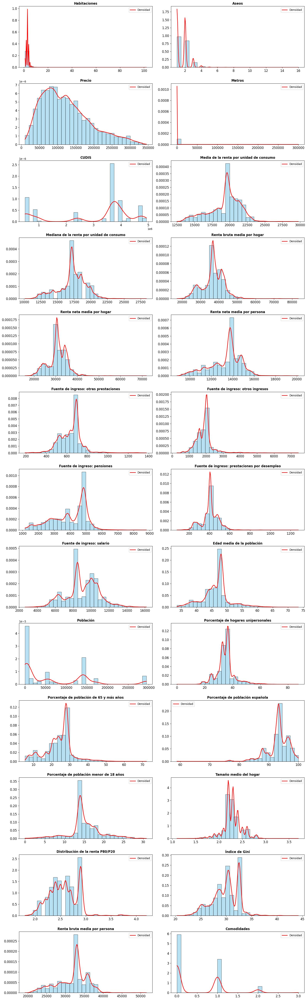

In [30]:
graficos_eda_numericos(df)

In [31]:
df['Habitaciones'].value_counts()

Habitaciones
3.00      9676
2.00      4461
4.00      3883
1.00      1441
5.00       892
6.00       278
7.00        95
8.00        63
9.00        20
10.00       18
12.00        7
11.00        7
14.00        2
41.00        1
16.00        1
13.00        1
18.00        1
17.00        1
102.00       1
Name: count, dtype: int64

#### Outliers

Se va a proceder a eliminar registros que presentan outliers, tenido en cuenta que dichos valores extremos pueden distorsionar los análisis estadísticos, generar sesgos en los resultados y afectar la interpretación de los datos. El uso del rango intercuartílico (IQR) permitirá identificar de manera objetiva los valores atípicos, eliminando propiedades que no representan adecuadamente el comportamiento típico del conjunto de datos. Esto garantiza un análisis más limpio y representativo de las tendencias habituales en el mercado inmobiliario. 

En este caso, podemos identificar claramente que hay registros que superan por mucho el 75% del conjunto de datos. En este caso se da la casuistica en las habitaciones, los metros y el precio de la vivienda. Por lo que se va a proceder a eliminar los outliers de estas variables para unificar el conjunto de datos.

##### Habitaciones

In [32]:
Q1 = df['Habitaciones'].quantile(0.25)
Q3 = df['Habitaciones'].quantile(0.75)
IQR = Q3 - Q1  # Rango intercuartílico

lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR

# Filtrar el DataFrame para eliminar registros fuera de los límites
df_filtered_1 = df[(df['Habitaciones'] >= lower_limit) & (df['Habitaciones'] <= upper_limit)]

# Mostrar los resultados
print(f"Límite inferior: {lower_limit}, Límite superior: {upper_limit}")
print(f"Filas antes de eliminar valores atípicos: {df.shape[0]}")
print(f"Filas después de eliminar valores atípicos: {df_filtered_1.shape[0]}")


Límite inferior: -1.0, Límite superior: 7.0
Filas antes de eliminar valores atípicos: 21535
Filas después de eliminar valores atípicos: 20726


#### Aseos

In [33]:
Q1 = df_filtered_1['Aseos'].quantile(0.25)
Q3 = df_filtered_1['Aseos'].quantile(0.75)
IQR = Q3 - Q1  # Rango intercuartílico

lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR

# Filtrar el DataFrame para eliminar registros fuera de los límites
df_filtered_2 = df_filtered_1[(df_filtered_1['Aseos'] >= lower_limit) & (df_filtered_1['Aseos'] <= upper_limit)]

# Mostrar los resultados
print(f"Límite inferior: {lower_limit}, Límite superior: {upper_limit}")
print(f"Filas antes de eliminar valores atípicos: {df.shape[0]}")
print(f"Filas después de eliminar valores atípicos: {df_filtered_2.shape[0]}")

Límite inferior: -0.5, Límite superior: 3.5
Filas antes de eliminar valores atípicos: 21535
Filas después de eliminar valores atípicos: 20232


##### Metros

In [34]:
Q1 = df_filtered_2['Metros'].quantile(0.25)
Q3 = df_filtered_2['Metros'].quantile(0.75)
IQR = Q3 - Q1  # Rango intercuartílico

lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR

# Filtrar el DataFrame para eliminar registros fuera de los límites
df_filtered = df_filtered_2[(df_filtered_2['Metros'] >= lower_limit) & (df_filtered_2['Metros'] <= upper_limit)]

# Mostrar los resultados
print(f"Límite inferior: {lower_limit}, Límite superior: {upper_limit}")
print(f"Filas antes de eliminar valores atípicos: {df.shape[0]}")
print(f"Filas después de eliminar valores atípicos: {df_filtered.shape[0]}")

Límite inferior: -1.5, Límite superior: 202.5
Filas antes de eliminar valores atípicos: 21535
Filas después de eliminar valores atípicos: 18455


##### Precio

La variable "Precio", al ser nuestra variable objetivo, tampoco nos interesa que tenga valores nulos, pero luego no se van a poder imputar debido a que nos es recomendable debido a que podríamos sesgar nuestro análisis. Por tanto, si son pocos datos, lo recomendable sería eliminar dichos registros nulos.

In [35]:
df_filtered['Precio'].isna().sum()

np.int64(0)

In [36]:
df_filtered = df_filtered.dropna(subset=['Precio'])

In [37]:
Q1 = df_filtered['Precio'].quantile(0.25)
Q3 = df_filtered['Precio'].quantile(0.75)
IQR = Q3 - Q1  # Rango intercuartílico

lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR

# Filtrar el DataFrame para eliminar registros fuera de los límites
df_filtered = df_filtered[(df_filtered['Precio'] >= lower_limit) & (df_filtered['Precio'] <= upper_limit)]

# Mostrar los resultados
print(f"Límite inferior: {lower_limit}, Límite superior: {upper_limit}")
print(f"Filas antes de eliminar valores atípicos: {df.shape[0]}")
print(f"Filas después de eliminar valores atípicos: {df_filtered.shape[0]}")

Límite inferior: -57500.0, Límite superior: 282500.0
Filas antes de eliminar valores atípicos: 21535
Filas después de eliminar valores atípicos: 18130


In [38]:
df_filtered['Precio'].sort_values()

12530    10,000.00
2191     10,000.00
21591    10,500.00
2726     10,900.00
8520     11,000.00
           ...    
20074   280,880.00
11237   281,000.00
2818    282,000.00
11008   282,000.00
22289   282,000.00
Name: Precio, Length: 18130, dtype: float64

### Histogramas del conjunto de datos filtrados

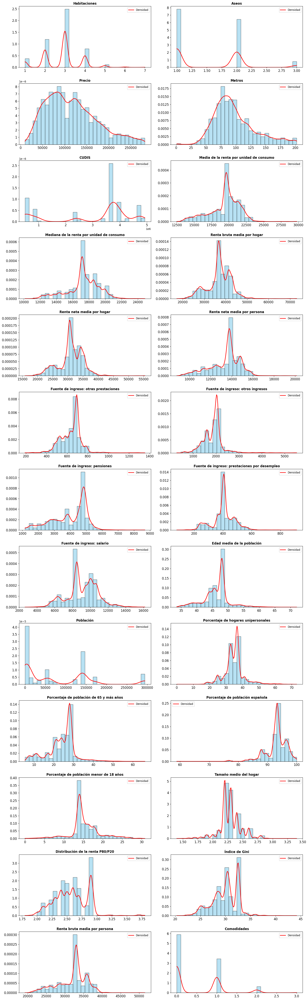

In [39]:
graficos_eda_numericos(df_filtered)

In [40]:
estadisticos_cont(df_filtered.select_dtypes('number'))

,count,mean,median,std,min,25%,50%,75%,max
Habitaciones,"18,130.00",2.84,3.00,0.91,1.00,2.00,3.00,3.00,7.00
Aseos,"18,130.00",1.53,1.00,0.59,1.00,1.00,1.00,2.00,3.00
Precio,"18,130.00","115,367.72","108,000.00","57,894.45","10,000.00","70,000.00","108,000.00","150,000.00","282,000.00"
Metros,"18,130.00",97.47,90.00,34.55,1.00,74.00,90.00,115.00,202.00
CUDIS,"18,130.00","3,056,041.89","3,727,403.00","1,461,889.31","500,101.00","2,407,601.00","3,727,403.00","4,007,604.00","4,927,505.00"
Media de la renta por unidad de consumo,"17,948.00","19,407.64","19,590.00","2,128.39","12,509.00","18,371.00","19,590.00","20,625.00","29,748.00"
Mediana de la renta por unidad de consumo,"17,948.00","17,283.03","17,150.00","1,964.66","10,150.00","16,450.00","17,150.00","18,550.00","24,850.00"
Renta bruta media por hogar,"18,130.00","37,031.89","36,686.00","5,538.53","17,221.00","34,710.00","36,686.00","41,235.00","73,084.00"
Renta neta media por hogar,"18,130.00","30,952.49","30,602.00","4,069.62","15,878.00","29,358.00","30,602.00","34,095.00","55,379.00"
Renta neta media por persona,"18,130.00","13,407.59","13,756.00","1,420.44","8,791.00","12,567.00","13,756.00","14,314.50","20,147.00"


In [41]:
df_filtered['Precio'].isna().sum()

np.int64(0)

### Imputación de valores 

Ahora bien, como hemos visto en el anterior apartado, tenemos valores faltantes que hay que imputar. Como realmente tenemos una cantidad pequeña de valores faltantes, se va a optar por imputarles a través de la mediana de los datos, de tal forma que tengamos un conjunto de datos completo y consistente, minimizando el impacto de estos valores faltantes en los análisis posteriores. La mediana es una medida robusta frente a los valores atípicos, por lo que su uso garantiza que los datos no se vean influenciados por registros extremos. Este enfoque permite preservar la distribución general de los datos, asegurando que las imputaciones no introduzcan sesgos significativos y manteniendo la integridad del análisis estadístico.

La eliminación de valores atípicos antes de la imputación de valores faltantes es un paso crucial para garantizar la calidad de los datos y la representatividad estadística del conjunto. Los valores extremos pueden sesgar las estadísticas utilizadas en la imputación, como la mediana o la media, introduciendo distorsiones en los datos completados. Al eliminar estos outliers primero, se asegura que las imputaciones se basen en patrones reales del conjunto, reflejando de manera más precisa el comportamiento típico de las variables. Esto no solo mejora la consistencia del análisis posterior, sino que también evita sesgos que podrían impactar negativamente en modelos predictivos y conclusiones estadísticas. Adoptar este enfoque garantiza un proceso más robusto y confiable, preservando la integridad de los datos y obteniendo resultados que representen adecuadamente las tendencias observadas.

In [42]:
def imputar_valores(df):
    """
    Imputa valores faltantes en un DataFrame.
    Utiliza la mediana para las variables numéricas y la moda para las variables categóricas.
    
    :param df: (DataFrame) El DataFrame con valores faltantes.
    :return: (DataFrame) El DataFrame con los valores imputados.
    """
    # Imputar valores numéricos con la mediana
    for col in df.select_dtypes(include=['number']).columns:
        mediana = df[col].median()  # Calcula la mediana
        df[col] = df[col].fillna(mediana)  # Imputa los valores faltantes con la mediana
    
    # Imputar valores categóricos con la moda
    for col in df.select_dtypes(include=['object']).columns:
        moda = df[col].mode()[0]  # Calcula la moda (el valor más frecuente)
        df[col] = df[col].fillna(moda)  # Imputa los valores faltantes con la moda
    
    return df

# Ejemplo de uso
# Supongamos que tienes un DataFrame llamado df con valores faltantes
df_imputado = imputar_valores(df_filtered)

# Verificamos los resultados
print(df_imputado.isnull().sum())  # Debe mostrar 0 valores faltantes


Fecha                                            0
Caracteristicas                                  0
Habitaciones                                     0
Aseos                                            0
Precio                                           0
Metros                                           0
CUDIS                                            0
Municipio                                        0
Provincia                                        0
Media de la renta por unidad de consumo          0
Mediana de la renta por unidad de consumo        0
Renta bruta media por hogar                      0
Renta neta media por hogar                       0
Renta neta media por persona                     0
Fuente de ingreso: otras prestaciones            0
Fuente de ingreso: otros ingresos                0
Fuente de ingreso: pensiones                     0
Fuente de ingreso: prestaciones por desempleo    0
Fuente de ingreso: salario                       0
Edad media de la población     

### Adición de nueva variable (Diferencia de precio medio por tipo de vivienda y provincia)

In [43]:
# Crear la columna de agrupación combinada
df_imputado['Municipio_Tipo'] = df_imputado['Municipio'] + "_" + df_imputado['Tipo_Vivienda']

# Calcular el precio medio por combinación Municipio + Tipo
precio_medio_por_grupo = df_imputado.groupby('Municipio_Tipo')['Precio'].mean()

# Mapear ese valor de vuelta al DataFrame original
df_imputado['Precio_medio_mun_tipo'] = df_imputado['Municipio_Tipo'].map(precio_medio_por_grupo)

# (Opcional) Crear también la diferencia respecto a la media para que el modelo entienda el "desvío local"
# df_imputado['Diferencia_precio_local'] = df_imputado['Precio'] - df_imputado['Precio_medio_prov_tipo']


# Análisis exploratorio de los datos

In [44]:
df_limpio = df_imputado.copy()

In [45]:
def categoricos_vs_continuo(df, objetivo):
    """
    Grafica la relación entre variables categóricas y una variable continua mediante gráficos de caja (boxplot).
    :param df: (DataFrame) El dataframe con las variables categóricas y la continua (objetivo).
    :param objetivo: (str) Nombre de la variable continua que se quiere analizar.
    :return: Muestra los gráficos.
    """
    # Seleccionar solo las variables categóricas
    categoricas = df.select_dtypes(include=['object', 'category'])
    
    # Calcular el número de filas necesarias para el subplot
    filas = ceil(categoricas.shape[1] / 2)
    fig, ax = plt.subplots(nrows=filas, ncols=2, figsize=(16, filas * 6))
    ax = ax.flat

    for posicion, columna in enumerate(categoricas.columns):
        sns.boxplot(x=df[columna], y=df[objetivo], ax=ax[posicion], hue=df[columna], palette="Set3", dodge=False)
        
        # Personalizar el gráfico
        ax[posicion].set_xlabel(columna, fontsize=12)
        ax[posicion].set_ylabel(objetivo, fontsize=12)
        ax[posicion].set_title(f'{columna} vs {objetivo}', fontsize=14, fontweight='bold')
        ax[posicion].tick_params(axis='x', rotation=30)

    # Ajustar el diseño y ocultar ejes no utilizados (si hay un número impar de gráficos)
    for i in range(len(categoricas.columns), len(ax)):
        fig.delaxes(ax[i])

    plt.tight_layout()
    plt.show()

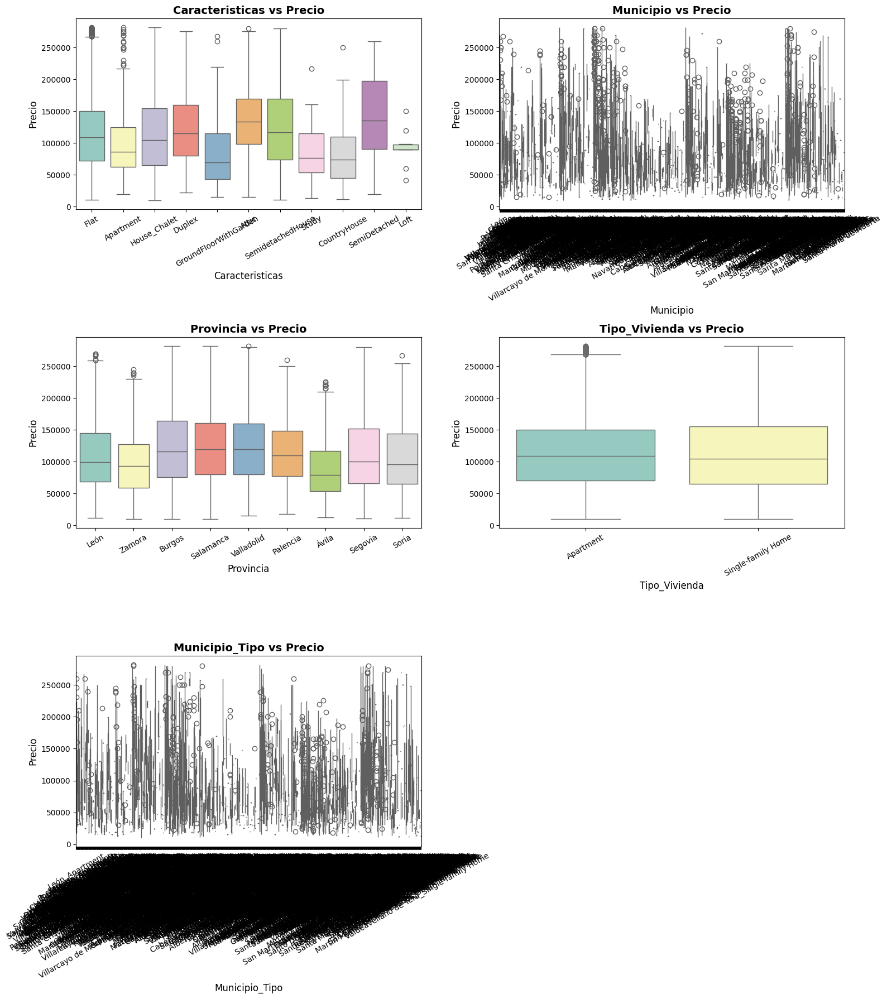

In [46]:
categoricos_vs_continuo(df_limpio, 'Precio')

In [47]:
def numericos_vs_continuo(df, objetivo):
    """
    Grafica la relación entre variables numéricas y una variable continua mediante gráficos de dispersión (scatterplot).
    :param df: (DataFrame) El dataframe con las variables numéricas y la continua (objetivo).
    :param objetivo: (str) Nombre de la variable continua que se quiere analizar.
    :return: Muestra los gráficos.
    """     
    # Seleccionar solo las variables numéricas
    numericos = df.select_dtypes(include=['number']).drop(columns=[objetivo], errors='ignore')  # Excluir la variable objetivo si está en las numéricas

    # Calcular el número de filas necesarias para el subplot
    filas = ceil(numericos.shape[1] / 2)
    fig, ax = plt.subplots(nrows=filas, ncols=2, figsize=(16, filas * 6))
    ax = ax.flat

    for posicion, columna in enumerate(numericos.columns):
        sns.scatterplot(x=df[columna], y=df[objetivo], ax=ax[posicion], color='skyblue', alpha=0.6)
        
        # Ajustar el gráfico
        ax[posicion].set_title(f'{columna} vs {objetivo}', fontsize=14, fontweight='bold')
        ax[posicion].set_xlabel(columna, fontsize=12)
        ax[posicion].set_ylabel(objetivo, fontsize=12)
        ax[posicion].tick_params(labelsize=10)

    # Ocultar gráficos no utilizados (si hay un número impar de variables)
    for i in range(len(numericos.columns), len(ax)):
        fig.delaxes(ax[i])

    plt.tight_layout()
    plt.show()


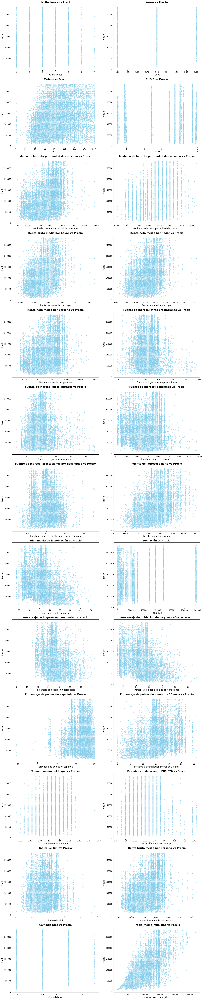

In [48]:
numericos_vs_continuo(df_limpio, 'Precio')

## Correlación de Variables

In [49]:
def graficar_corr_matrix(df):
    """
    Genera y visualiza la matriz de correlación de un DataFrame con variables numéricas.
    
    :param df: (DataFrame) El DataFrame que contiene las variables numéricas.
    :return: Muestra el gráfico de la matriz de correlación.
    """
    # Calcular la matriz de correlación
    corr_matrix = df.select_dtypes('number').corr(method='pearson')

    # Crear la figura y los ejes
    fig, ax = plt.subplots(figsize=(16, 16))

    # Definir los colores
    color_list = ['PLUM', 'white', '#6FD08C']
    cmap = LinearSegmentedColormap.from_list("", color_list)

    # Crear el gráfico de matriz de correlación
    cax = ax.imshow(corr_matrix, cmap=cmap, vmin=-1, vmax=1)

    # Añadir valores al gráfico
    for i in range(corr_matrix.shape[0]):
        for j in range(corr_matrix.shape[1]):
            ax.text(j, i, round(corr_matrix.iloc[i, j], 2),
                    ha="center", va="center", color="black", fontsize=9)

    # Añadir barra de color
    cbar = fig.colorbar(cax)

    # Configurar etiquetas de las columnas y filas
    ax.set_xticks(np.arange(len(corr_matrix.columns)))
    ax.set_yticks(np.arange(len(corr_matrix.columns)))
    ax.set_xticklabels(corr_matrix.columns, rotation=45, ha="right", fontsize=9)
    ax.set_yticklabels(corr_matrix.columns, fontsize=12)

    # Mantener una proporción consistente en los gráficos
    ax.set_aspect('equal')

    # Ajustar el diseño
    plt.tight_layout()
    plt.show()


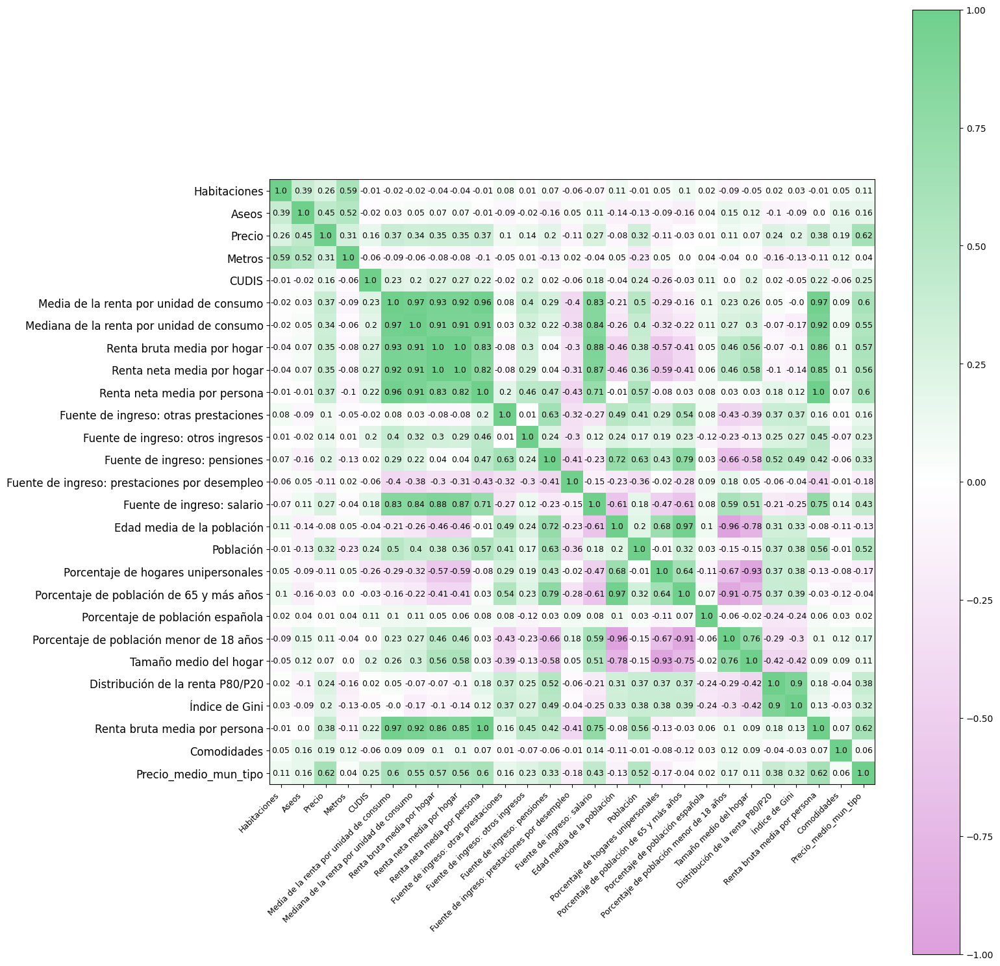

In [50]:
graficar_corr_matrix(df_limpio)

In [51]:
df_limpio.columns

Index(['Fecha', 'Caracteristicas', 'Habitaciones', 'Aseos', 'Precio', 'Metros',
       'CUDIS', 'Municipio', 'Provincia',
       'Media de la renta por unidad de consumo',
       'Mediana de la renta por unidad de consumo',
       'Renta bruta media por hogar', 'Renta neta media por hogar',
       'Renta neta media por persona', 'Fuente de ingreso: otras prestaciones',
       'Fuente de ingreso: otros ingresos', 'Fuente de ingreso: pensiones',
       'Fuente de ingreso: prestaciones por desempleo',
       'Fuente de ingreso: salario', 'Edad media de la población', 'Población',
       'Porcentaje de hogares unipersonales',
       'Porcentaje de población de 65 y más años',
       'Porcentaje de población española',
       'Porcentaje de población menor de 18 años', 'Tamaño medio del hogar',
       'Distribución de la renta P80/P20', 'Índice de Gini',
       'Renta bruta media por persona', 'Comodidades', 'Tipo_Vivienda',
       'Capital', 'Municipio_Tipo', 'Precio_medio_mun_tipo'],
    

In [52]:
columnas_a_eliminar = ['Media de la renta por unidad de consumo', 'Mediana de la renta por unidad de consumo', 
                       'Renta neta media por hogar', 'Renta neta media por persona', 'Renta bruta media por hogar',
                       'Porcentaje de población de 65 y más años','Porcentaje de población menor de 18 años',  
                       'Tamaño medio del hogar', 'Fuente de ingreso: salario',
                       'Fuente de ingreso: otras prestaciones', 'Fuente de ingreso: otros ingresos', 'Fuente de ingreso: pensiones', 'Fuente de ingreso: prestaciones por desempleo',
                       'Porcentaje de población española', 'Edad media de la población' , 
                       'Índice de Gini', 'Distribución de la renta P80/P20',
                       'Municipio', 'Caracteristicas',  'Porcentaje de hogares unipersonales', 'Tipo_Vivienda'] 

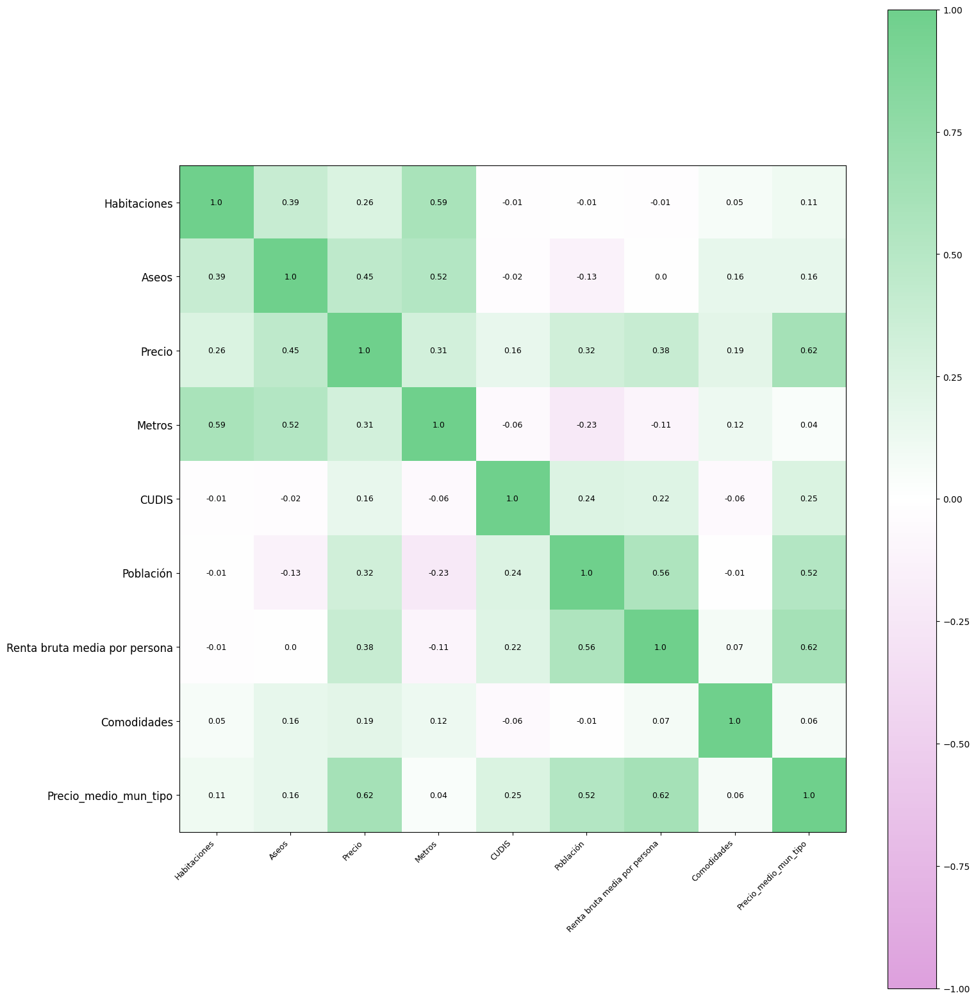

In [53]:
df_reducido = df_limpio.drop(columnas_a_eliminar, axis = 1)
graficar_corr_matrix(df_reducido)

La renta bruta por hogar es una métrica integral que probablemente capture gran parte de la variabilidad explicada por las fuentes de ingreso eliminadas. Esto debería ayudarte a mantener un buen desempeño predictivo y evitar sesgos.
Se han eliminado las variables que tenían un alto nivel de correlación (>0.7) para evitar la multicolinealidad en los siguientes pasos. 

## Detección de Outliers: PCA y distancia de Mahalanobis 

Para analizar los outliers de este dataset de forma conjunta se va a utilizar el análisis de componentes principales (PCA, por sus siglas en inglés). Vamos a convertir cada variable factor en una columna binaria para evitar suposiciones de orden.

In [54]:
df_reducido.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18130 entries, 0 to 23304
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   Fecha                          18130 non-null  datetime64[ns]
 1   Habitaciones                   18130 non-null  float64       
 2   Aseos                          18130 non-null  float64       
 3   Precio                         18130 non-null  float64       
 4   Metros                         18130 non-null  float64       
 5   CUDIS                          18130 non-null  float64       
 6   Provincia                      18130 non-null  object        
 7   Población                      18130 non-null  float64       
 8   Renta bruta media por persona  18130 non-null  float64       
 9   Comodidades                    18130 non-null  int64         
 10  Capital                        18130 non-null  bool          
 11  Municipio_Tipo      

In [55]:
# One-hot encoding de las variables categóricas
df_reducido_encoded = pd.get_dummies(
    df_reducido,
    columns=list(df_reducido.select_dtypes(['object']).columns),
    drop_first=True
)
df_reducido_encoded.head()

,Fecha,Habitaciones,Aseos,Precio,Metros,CUDIS,Población,Renta bruta media por persona,Comodidades,Capital,Precio_medio_mun_tipo,Provincia_León,Provincia_Palencia,Provincia_Salamanca,Provincia_Segovia,Provincia_Soria,Provincia_Valladolid,Provincia_Zamora,Provincia_Ávila,Municipio_Tipo_Abades_Single-family Home,Municipio_Tipo_Adanero_Apartment,Municipio_Tipo_Adrada de Pirón_Single-family Home,"Municipio_Tipo_Adrada, La_Apartment","Municipio_Tipo_Adrada, La_Single-family Home",Municipio_Tipo_Adrados_Single-family Home,Municipio_Tipo_Aguilar de Campoo_Apartment,Municipio_Tipo_Aguilar de Campoo_Single-family Home,Municipio_Tipo_Ahigal de los Aceiteros_Single-family Home,Municipio_Tipo_Alaejos_Apartment,Municipio_Tipo_Alaejos_Single-family Home,Municipio_Tipo_Alar del Rey_Apartment,Municipio_Tipo_Alaraz_Apartment,Municipio_Tipo_Alaraz_Single-family Home,Municipio_Tipo_Alba de Tormes_Apartment,Municipio_Tipo_Alba de Tormes_Single-family Home,"Municipio_Tipo_Alberca, La_Apartment","Municipio_Tipo_Alberca, La_Single-family Home","Municipio_Tipo_Alberguería de Argañán, La_Apartment","Municipio_Tipo_Alberguería de Argañán, La_Single-family Home",Municipio_Tipo_Albornos_Single-family Home,Municipio_Tipo_Alcazarén_Single-family Home,Municipio_Tipo_Alcañices_Single-family Home,Municipio_Tipo_Alconada_Apartment,Municipio_Tipo_Aldea Real_Apartment,Municipio_Tipo_Aldea Real_Single-family Home,Municipio_Tipo_Aldea del Obispo_Apartment,Municipio_Tipo_Aldea del Obispo_Single-family Home,Municipio_Tipo_Aldeadávila de la Ribera_Apartment,Municipio_Tipo_Aldeadávila de la Ribera_Single-family Home,Municipio_Tipo_Aldealengua de Pedraza_Single-family Home,Municipio_Tipo_Aldealengua_Apartment,Municipio_Tipo_Aldealengua_Single-family Home,Municipio_Tipo_Aldeamayor de San Martín_Apartment,Municipio_Tipo_Aldeamayor de San Martín_Single-family Home,Municipio_Tipo_Aldeanueva de Santa Cruz_Apartment,Municipio_Tipo_Aldeanueva de la Sierra_Single-family Home,Municipio_Tipo_Aldearrubia_Apartment,Municipio_Tipo_Aldearrubia_Single-family Home,Municipio_Tipo_Aldeaseca de Alba_Apartment,Municipio_Tipo_Aldeatejada_Apartment,Municipio_Tipo_Aldeatejada_Single-family Home,Municipio_Tipo_Aldehuela de Yeltes_Single-family Home,Municipio_Tipo_Aldehuela de la Bóveda_Apartment,Municipio_Tipo_Aldehuela de la Bóveda_Single-family Home,"Municipio_Tipo_Aldehuela, La_Single-family Home",Municipio_Tipo_Alfaraz de Sayago_Apartment,Municipio_Tipo_Alfoz de Quintanadueñas_Apartment,Municipio_Tipo_Alfoz de Quintanadueñas_Single-family Home,Municipio_Tipo_Alija del Infantado_Apartment,Municipio_Tipo_Alija del Infantado_Single-family Home,Municipio_Tipo_Almarza_Single-family Home,Municipio_Tipo_Almazán_Apartment,Municipio_Tipo_Almazán_Single-family Home,Municipio_Tipo_Almenar de Soria_Single-family Home,Municipio_Tipo_Almenara de Tormes_Apartment,Municipio_Tipo_Almenara de Tormes_Single-family Home,Municipio_Tipo_Amavida_Single-family Home,Municipio_Tipo_Anaya de Alba_Single-family Home,"Municipio_Tipo_Antigua, La_Single-family Home",Municipio_Tipo_Arabayona de Mógica_Apartment,Municipio_Tipo_Arabayona de Mógica_Single-family Home,Municipio_Tipo_Aranda de Duero_Apartment,Municipio_Tipo_Aranda de Duero_Single-family Home,Municipio_Tipo_Arapiles_Apartment,Municipio_Tipo_Arapiles_Single-family Home,Municipio_Tipo_Arcones_Single-family Home,Municipio_Tipo_Arcos de Jalón_Apartment,Municipio_Tipo_Arcos de Jalón_Single-family Home,Municipio_Tipo_Arcos_Single-family Home,Municipio_Tipo_Ardón_Single-family Home,"Municipio_Tipo_Arenal, El_Apartment","Municipio_Tipo_Arenal, El_Single-family Home",Municipio_Tipo_Arenas de San Pedro_Apartment,Municipio_Tipo_Arenas de San Pedro_Single-family Home,Municipio_Tipo_Arlanzón_Single-family Home,Municipio_Tipo_Armenteros_Apartment,Municipio_Tipo_Armenteros_Single-family Home,Municipio_Tipo_Armuña_Apartment,Municipio_Tipo_Armuña_Single-family Home,Municipio_Tipo_Arquillinos_Single-family Home,Municipio_Tipo_Arroyo de la Encomienda_Apartment,Municipio_Tipo_Arr

In [56]:
# Normalización de las variables numéricas
numeric_columns=list(df_reducido.select_dtypes(['number']).columns)
numeric_vars = df_reducido_encoded.select_dtypes('number')
scaler = StandardScaler()
numeric_vars_scaled = scaler.fit_transform(numeric_vars)
df_reducido_encoded[numeric_columns] = numeric_vars_scaled
df_reducido_encoded.drop('Fecha', axis = 1, inplace = True)
df_reducido_encoded.head()

,Habitaciones,Aseos,Precio,Metros,CUDIS,Población,Renta bruta media por persona,Comodidades,Capital,Precio_medio_mun_tipo,Provincia_León,Provincia_Palencia,Provincia_Salamanca,Provincia_Segovia,Provincia_Soria,Provincia_Valladolid,Provincia_Zamora,Provincia_Ávila,Municipio_Tipo_Abades_Single-family Home,Municipio_Tipo_Adanero_Apartment,Municipio_Tipo_Adrada de Pirón_Single-family Home,"Municipio_Tipo_Adrada, La_Apartment","Municipio_Tipo_Adrada, La_Single-family Home",Municipio_Tipo_Adrados_Single-family Home,Municipio_Tipo_Aguilar de Campoo_Apartment,Municipio_Tipo_Aguilar de Campoo_Single-family Home,Municipio_Tipo_Ahigal de los Aceiteros_Single-family Home,Municipio_Tipo_Alaejos_Apartment,Municipio_Tipo_Alaejos_Single-family Home,Municipio_Tipo_Alar del Rey_Apartment,Municipio_Tipo_Alaraz_Apartment,Municipio_Tipo_Alaraz_Single-family Home,Municipio_Tipo_Alba de Tormes_Apartment,Municipio_Tipo_Alba de Tormes_Single-family Home,"Municipio_Tipo_Alberca, La_Apartment","Municipio_Tipo_Alberca, La_Single-family Home","Municipio_Tipo_Alberguería de Argañán, La_Apartment","Municipio_Tipo_Alberguería de Argañán, La_Single-family Home",Municipio_Tipo_Albornos_Single-family Home,Municipio_Tipo_Alcazarén_Single-family Home,Municipio_Tipo_Alcañices_Single-family Home,Municipio_Tipo_Alconada_Apartment,Municipio_Tipo_Aldea Real_Apartment,Municipio_Tipo_Aldea Real_Single-family Home,Municipio_Tipo_Aldea del Obispo_Apartment,Municipio_Tipo_Aldea del Obispo_Single-family Home,Municipio_Tipo_Aldeadávila de la Ribera_Apartment,Municipio_Tipo_Aldeadávila de la Ribera_Single-family Home,Municipio_Tipo_Aldealengua de Pedraza_Single-family Home,Municipio_Tipo_Aldealengua_Apartment,Municipio_Tipo_Aldealengua_Single-family Home,Municipio_Tipo_Aldeamayor de San Martín_Apartment,Municipio_Tipo_Aldeamayor de San Martín_Single-family Home,Municipio_Tipo_Aldeanueva de Santa Cruz_Apartment,Municipio_Tipo_Aldeanueva de la Sierra_Single-family Home,Municipio_Tipo_Aldearrubia_Apartment,Municipio_Tipo_Aldearrubia_Single-family Home,Municipio_Tipo_Aldeaseca de Alba_Apartment,Municipio_Tipo_Aldeatejada_Apartment,Municipio_Tipo_Aldeatejada_Single-family Home,Municipio_Tipo_Aldehuela de Yeltes_Single-family Home,Municipio_Tipo_Aldehuela de la Bóveda_Apartment,Municipio_Tipo_Aldehuela de la Bóveda_Single-family Home,"Municipio_Tipo_Aldehuela, La_Single-family Home",Municipio_Tipo_Alfaraz de Sayago_Apartment,Municipio_Tipo_Alfoz de Quintanadueñas_Apartment,Municipio_Tipo_Alfoz de Quintanadueñas_Single-family Home,Municipio_Tipo_Alija del Infantado_Apartment,Municipio_Tipo_Alija del Infantado_Single-family Home,Municipio_Tipo_Almarza_Single-family Home,Municipio_Tipo_Almazán_Apartment,Municipio_Tipo_Almazán_Single-family Home,Municipio_Tipo_Almenar de Soria_Single-family Home,Municipio_Tipo_Almenara de Tormes_Apartment,Municipio_Tipo_Almenara de Tormes_Single-family Home,Municipio_Tipo_Amavida_Single-family Home,Municipio_Tipo_Anaya de Alba_Single-family Home,"Municipio_Tipo_Antigua, La_Single-family Home",Municipio_Tipo_Arabayona de Mógica_Apartment,Municipio_Tipo_Arabayona de Mógica_Single-family Home,Municipio_Tipo_Aranda de Duero_Apartment,Municipio_Tipo_Aranda de Duero_Single-family Home,Municipio_Tipo_Arapiles_Apartment,Municipio_Tipo_Arapiles_Single-family Home,Municipio_Tipo_Arcones_Single-family Home,Municipio_Tipo_Arcos de Jalón_Apartment,Municipio_Tipo_Arcos de Jalón_Single-family Home,Municipio_Tipo_Arcos_Single-family Home,Municipio_Tipo_Ardón_Single-family Home,"Municipio_Tipo_Arenal, El_Apartment","Municipio_Tipo_Arenal, El_Single-family Home",Municipio_Tipo_Arenas de San Pedro_Apartment,Municipio_Tipo_Arenas de San Pedro_Single-family Home,Municipio_Tipo_Arlanzón_Single-family Home,Municipio_Tipo_Armenteros_Apartment,Municipio_Tipo_Armenteros_Single-family Home,Municipio_Tipo_Armuña_Apartment,Municipio_Tipo_Armuña_Single-family Home,Municipio_Tipo_Arquillinos_Single-family Home,Municipio_Tipo_Arroyo de la Encomienda_Apartment,Municipio_Tipo_Arroyo de

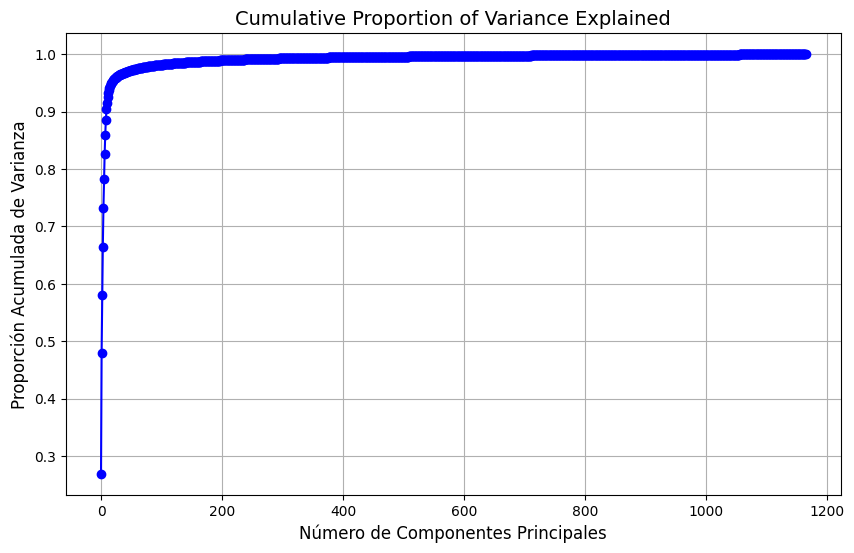

In [57]:
#  PCA
pca = PCA()
pca_result = pca.fit_transform(df_reducido_encoded)

# Resumen de la varianza explicada
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

# Graficar la varianza acumulada
plt.figure(figsize=(10, 6))
plt.plot(cumulative_variance_ratio, marker='o', color='blue')
plt.title("Cumulative Proportion of Variance Explained", fontsize=14)
plt.xlabel("Número de Componentes Principales", fontsize=12)
plt.ylabel("Proporción Acumulada de Varianza", fontsize=12)
plt.grid()
plt.show()

In [58]:
# Seleccion del nº de componentes principales que explican >90% de la varianza
num_components = np.argmax(cumulative_variance_ratio >= 0.90) + 1
pca_data = pd.DataFrame(pca_result[:, :num_components], columns=[f"PC{i+1}" for i in range(num_components)])
pca_data.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,-0.00,-2.03,-0.44,-0.88,-0.00,0.97,-0.12,-0.19,-0.44,-0.02
1,0.89,0.32,-1.08,-0.05,0.43,0.81,0.42,-0.55,-0.65,0.19
2,-0.20,-2.88,-0.74,-0.52,-0.72,1.03,0.15,-0.05,-0.50,-0.04
3,0.65,-0.57,-2.15,0.90,1.55,0.30,-0.67,-0.44,-0.39,0.13
4,0.14,-1.77,-1.43,0.18,0.49,0.72,-0.24,-0.31,-0.57,0.04


In [59]:
# Calcular la distancia de Mahalanobis
cov_matrix = np.cov(pca_data.values.T)  # Matriz de covarianza
mean_data = np.mean(pca_data, axis=0)  # Media de las puntuaciones de PCA

mahal_dist = np.array([
    (row - mean_data).T @ np.linalg.inv(cov_matrix) @ (row - mean_data)
    for row in pca_data.values
])

# Umbral (basado en la distribución chi-cuadrada)
threshold = chi2.ppf(0.95, df=num_components)

# Identificar los outliers
outliers = mahal_dist > threshold
print("Outliers identificados:", np.where(outliers)[0])


Outliers identificados: [   29    80   111 ... 18094 18117 18128]


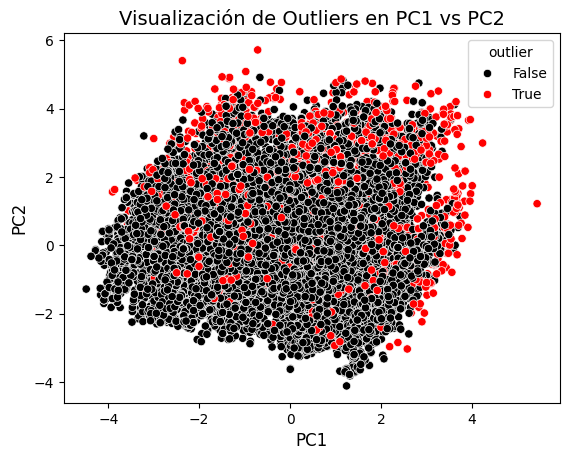

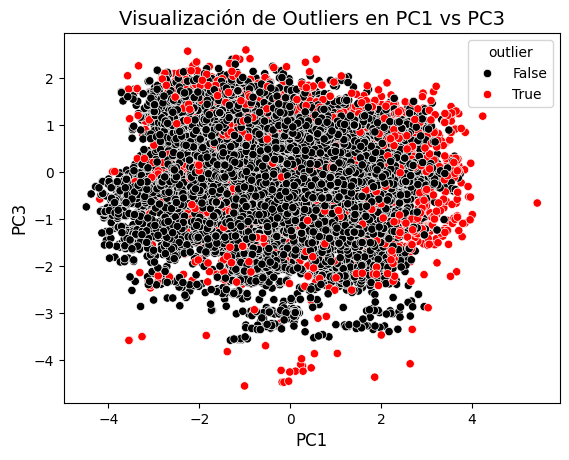

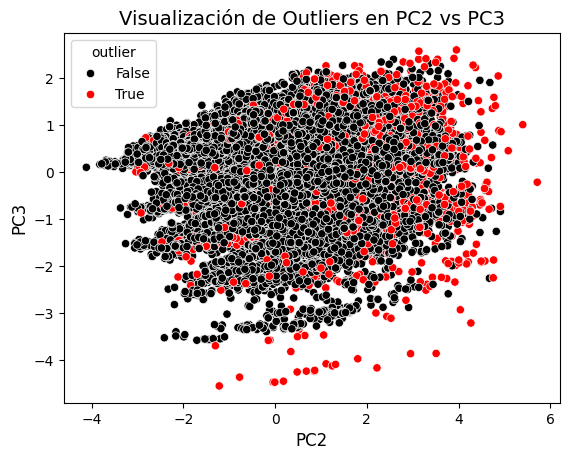

In [60]:
# Visualización de los outliers
pca_data["outlier"] = outliers

# Graficar PC1 vs PC2
sns.scatterplot(data=pca_data, x="PC1", y="PC2", hue="outlier",
                palette={False: "black", True: "red"}, legend="full")
plt.title("Visualización de Outliers en PC1 vs PC2", fontsize=14)
plt.xlabel("PC1", fontsize=12)
plt.ylabel("PC2", fontsize=12)
plt.show()

# Graficar PC1 vs PC3
sns.scatterplot(data=pca_data, x="PC1", y="PC3", hue="outlier",
                palette={False: "black", True: "red"}, legend="full")
plt.title("Visualización de Outliers en PC1 vs PC3", fontsize=14)
plt.xlabel("PC1", fontsize=12)
plt.ylabel("PC3", fontsize=12)
plt.show()

# Graficar PC2 vs PC3
sns.scatterplot(data=pca_data, x="PC2", y="PC3", hue="outlier",
                palette={False: "black", True: "red"}, legend="full")
plt.title("Visualización de Outliers en PC2 vs PC3", fontsize=14)
plt.xlabel("PC2", fontsize=12)
plt.ylabel("PC3", fontsize=12)
plt.show()

In [61]:
# Eliminar outliers del dataset original
df_final = df_reducido[~outliers]
print(f"Filas del dataset original: {df.shape[0]}")
print(f"Filas después de eliminar valores atípicos de manera individual: {df_filtered.shape[0]}")
print("Filas después de eliminar valores atípicos con la distancia de mahalanobis:", df_final.shape[0])

Filas del dataset original: 21535
Filas después de eliminar valores atípicos de manera individual: 18130
Filas después de eliminar valores atípicos con la distancia de mahalanobis: 16769


In [62]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 16769 entries, 0 to 23304
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   Fecha                          16769 non-null  datetime64[ns]
 1   Habitaciones                   16769 non-null  float64       
 2   Aseos                          16769 non-null  float64       
 3   Precio                         16769 non-null  float64       
 4   Metros                         16769 non-null  float64       
 5   CUDIS                          16769 non-null  float64       
 6   Provincia                      16769 non-null  object        
 7   Población                      16769 non-null  float64       
 8   Renta bruta media por persona  16769 non-null  float64       
 9   Comodidades                    16769 non-null  int64         
 10  Capital                        16769 non-null  bool          
 11  Municipio_Tipo      

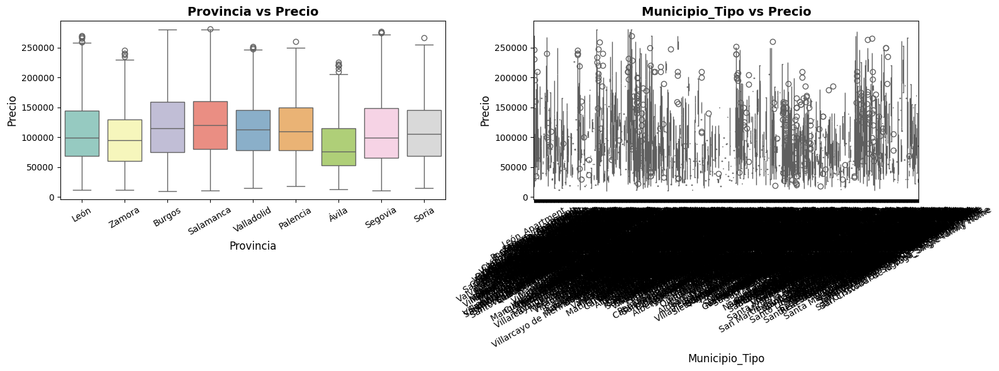

In [63]:
categoricos_vs_continuo(df_final, 'Precio')

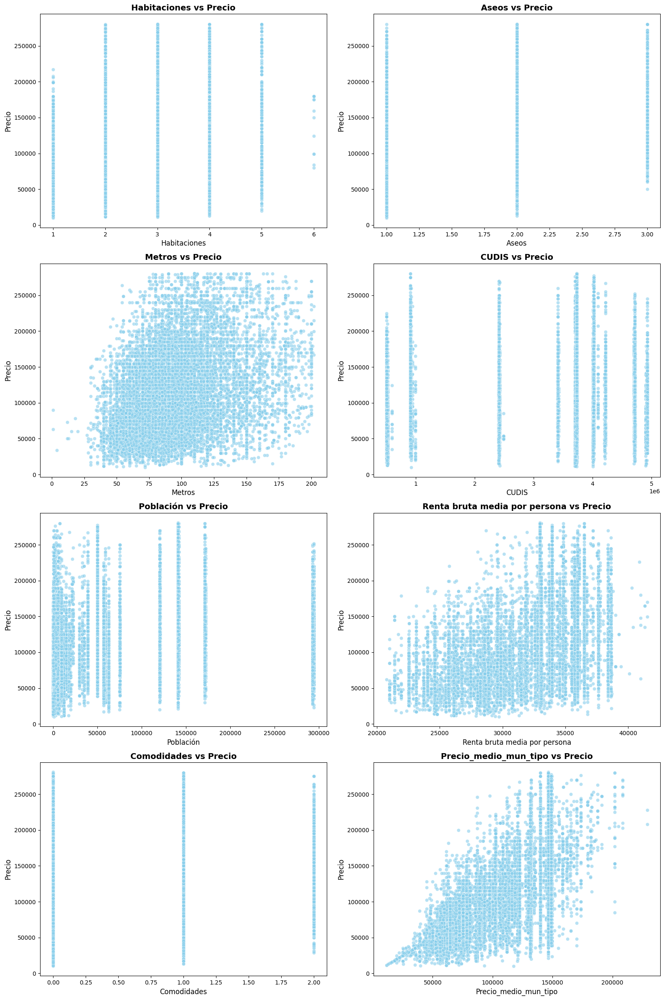

In [64]:
numericos_vs_continuo(df_final, 'Precio')

# ¿Transformación de la variable objetivo?

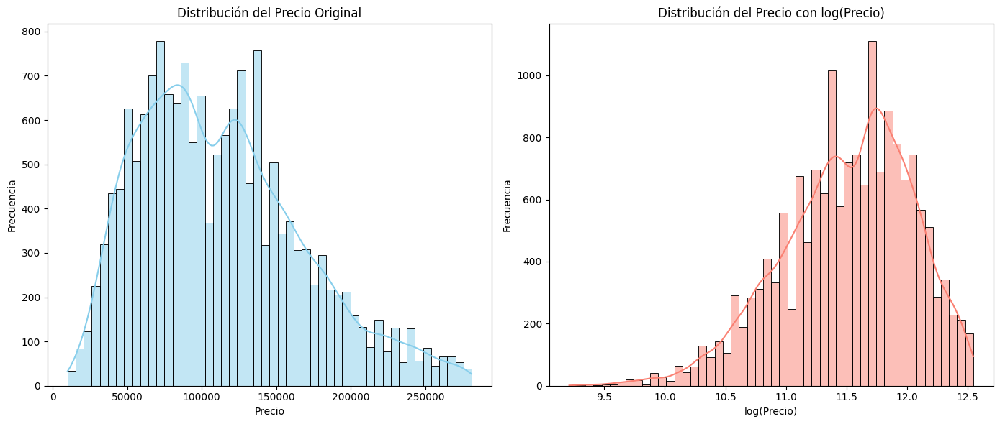

In [65]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Supongamos que tu DataFrame se llama df y tiene una columna "precio"
# Aplica logaritmo natural (asegurándote de que no haya ceros)
df_prec = df_final[df_final["Precio"] > 0].copy()
df_prec["log_precio"] = np.log(df_final["Precio"])

# Graficar comparativa
plt.figure(figsize=(14, 6))

# Precio original
plt.subplot(1, 2, 1)
sns.histplot(df_prec["Precio"], bins=50, kde=True, color='skyblue')
plt.title("Distribución del Precio Original")
plt.xlabel("Precio")
plt.ylabel("Frecuencia")

# Precio transformado con log
plt.subplot(1, 2, 2)
sns.histplot(df_prec["log_precio"], bins=50, kde=True, color='salmon')
plt.title("Distribución del Precio con log(Precio)")
plt.xlabel("log(Precio)")
plt.ylabel("Frecuencia")

plt.tight_layout()
plt.show()


Claramente el log(Precio) tiene una distribución mucho más simétrica y cercana a una normal, lo cual es ideal si vamos a usar modelos como regresión lineal, k-NN, redes neuronales, etc. Es una muy buena idea transformar.

# Carga de datos limpios

In [66]:
try:
    engine = connect_to_postgresql()
    conn = engine.raw_connection()
    cur = conn.cursor()
    print("Empieza la carga ft_indicadores")
    df_final.to_sql('ft_indicadores', engine, if_exists='replace', index=False)
    print("Carga de ft_indicadores correcta")
except Exception as e:
    print(f"Las tablas no se han podido cargar debido a: ", str(e))
finally:
    if conn:
        conn.close()
        print("Conexión cerrada correctamente.")


Conexión establecida
Empieza la carga ft_indicadores
Carga de ft_indicadores correcta
Conexión cerrada correctamente.
